In [11]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
import scipy

import rampy
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

In [12]:
dt1_1 = pd.read_table('/Users/hanami/Desktop/File Antibiotics experiment on foil 20210811/002 Antibiotics standard on Foil (Mapping)/Mapping Antibiotics standard on Foil 10-1M/6_Mapping_Foil_4-nitroimidazole_10-1M_5x_10s_P10__Copy.txt')

In [13]:
dt1_1.drop(['#Intensity'], axis=1, inplace=True)
dt1_1.drop(['#Wave'], axis=1, inplace=True)
dt1_1.drop(['Unnamed: 5'], axis=1, inplace=True)

In [14]:
dt1_1.rename(columns={'#Y':'#Wave'},inplace=True)
dt1_1.rename(columns={'Unnamed: 3':'#Intensity'},inplace=True)
dt1_1.rename(columns={'Unnamed: 1':'#Y'},inplace=True)

In [15]:
dt1_1

,#X,#Y,#Wave,#Intensity
0,34231.887766,-2091.92,1723.362305,3141.526123
1,34231.887766,-2091.92,1722.382813,3113.453857
2,34231.887766,-2091.92,1721.402344,3120.515381
3,34231.887766,-2091.92,1720.422852,3229.614990
4,34231.887766,-2091.92,1719.442383,3165.235107
...,...,...,...,...
202395,34991.887766,-1731.92,623.795898,5902.582031
202396,34991.887766,-1731.92,622.573242,5935.884277
202397,34991.887766,-1731.92,621.351563,6077.586914
202398,34991.887766,-1731.92,620.128906,6266.254883


Text(0, 0.5, 'Intensity(a.u.)')

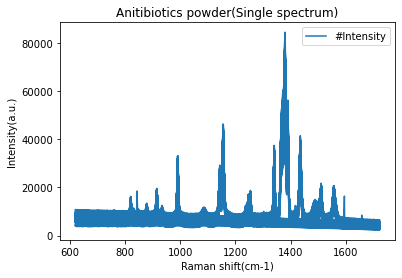

In [16]:
dt1_1.plot('#Wave', '#Intensity')
plt.title("Anitibiotics powder(Single spectrum)")
plt.xlabel('Raman shift(cm-1)')
plt.ylabel('Intensity(a.u.)')

In [17]:
y = np.array(dt1_1['#Intensity'])
Y = y.reshape(200,1012)
x = np.array(dt1_1['#Wave'])
X = x.reshape(200,1012)

In [18]:
roi = np.array([[600,780],[820,990],[1040, 1180],[1220,1300],[1610,1700]])

In [19]:
ycalc_drpls, base_drpls = rampy.baseline(x,y,roi,'drPLS')

In [20]:
ycalc_drpls.shape,base_drpls.shape,x.shape

((202400, 1), (202400, 1), (202400,))

In [21]:
yd = ycalc_drpls.reshape(202400,)
yd.shape

(202400,)

In [22]:
YD = yd.reshape(200,1012)
YD.shape,type(YD)

((200, 1012), numpy.ndarray)

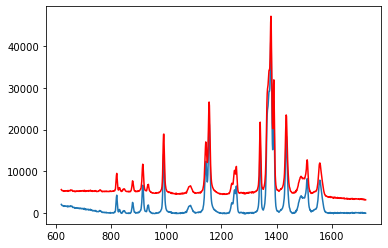

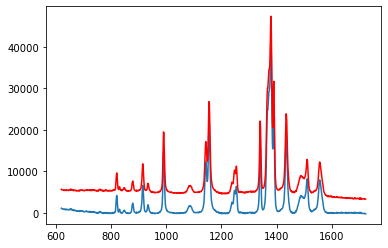

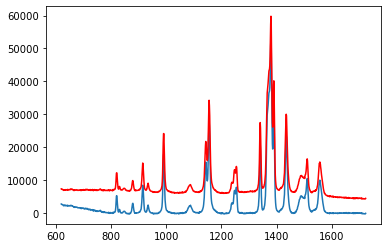

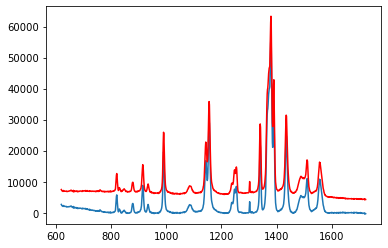

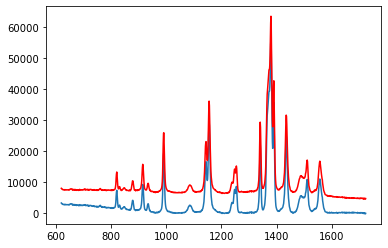

...

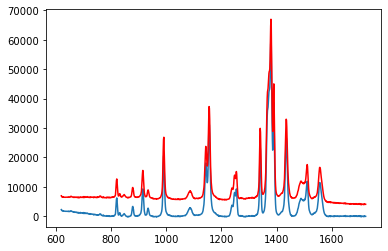

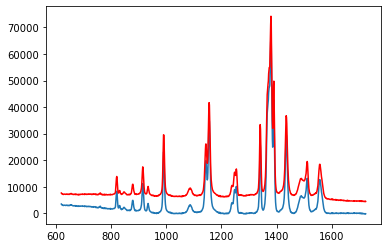

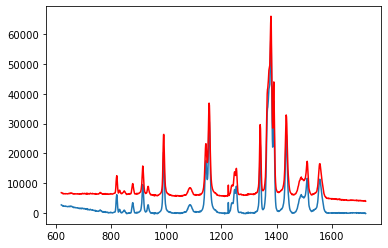

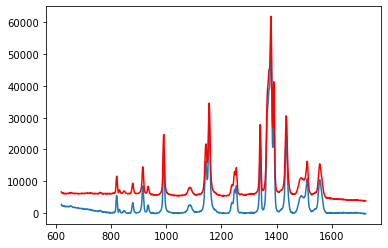

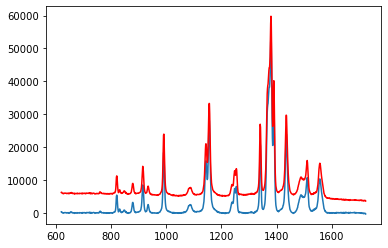

In [23]:
for i in range(len(X)):
    plt.figure()
    plt.plot(X[i],YD[i])
    plt.plot(X[i],Y[i],c = 'r')
    plt.show()

In [24]:
YD

array([[ -61.26488881,  -92.65157321,  -88.9043517 , ..., 1807.9470274 ,
        1893.31898948, 2039.7897084 ],
       [-246.41964397, -222.19483099, -191.15964855, ...,  961.2069006 ,
        1027.98998282, 1127.29216222],
       [ -71.95526042, -228.45526244, -243.03274863, ..., 2580.48101174,
        2772.3190647 , 2773.64973887],
       ...,
       [-182.88779351,  -58.99514979,   12.93194811, ..., 2537.19096901,
        2660.45028188, 2715.92618131],
       [-314.93916911, -271.61962604, -249.70682179, ..., 2438.02085914,
        2418.10873875, 2651.50206602],
       [-342.35248121, -186.77799837, -164.87277464, ...,  146.91652069,
         334.84729927,  277.3293476 ]])

In [25]:
#np.save('Spectrun_4-nitroimidaz_10-1_Baseline.npy',YD)

# change data( A )

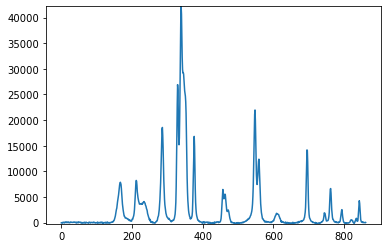

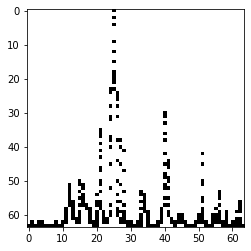

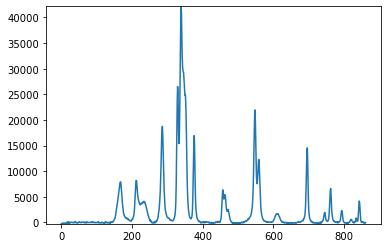

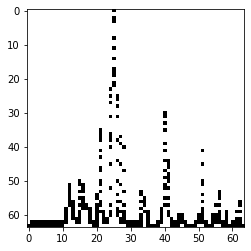

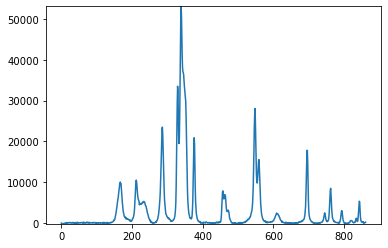

...

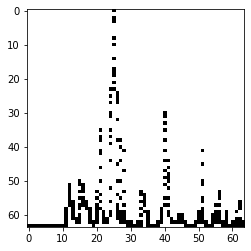

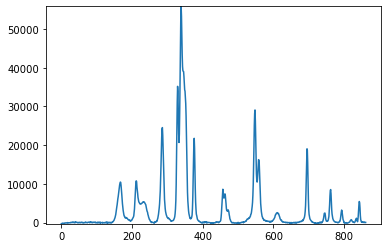

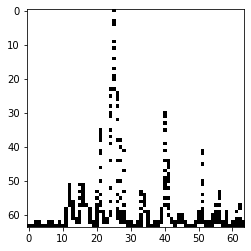

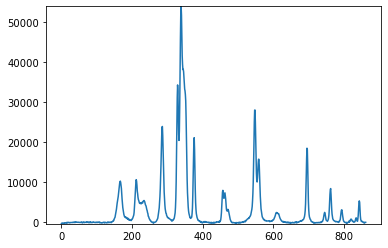

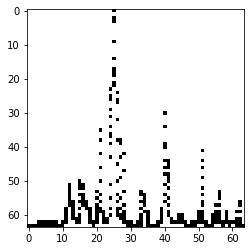

In [26]:
Q = np.empty((200, 64, 64))
for z in range(0,200,1):
    A = z
    X1 = []
    Y1 = []
    for j in range(A*1012,((A+1)*1012)-150,1):
        X1.append(x[j])
        Y1.append(yd[j])
    
    X1 = np.array(X1)
    Y1 = np.array(Y1)
    Y2 = pd.DataFrame(Y1,columns=['y'])
    y_min = int(np.array(Y2.agg(['min'])))
    y_max = int(np.array(Y2.agg(['max'])))

    spec = Y1 #<assign your spectrum here>
 
    x_min = 0
    x_max = len(spec)

    y_min = y_min # min amplitude of spectrum <please specify>
    y_max = y_max # max amplitude of spectrum <please specify>
 
    image_width = 64 # image width
    image_height = 64 # image height
 
    I = np.ones((image_height, image_width))


    for i in np.arange(len(spec)):
    
        x_spec = i
        y_spec = spec[i]
        x_img = int(np.round((x_spec-x_min)/(x_max-x_min)*(image_width-1)))
        y_img = int(np.round((image_height-1) - (y_spec-y_min)/(y_max-y_min)*(image_height-1)), )
        I[y_img, x_img] = 0
    
    for l in range(len(I)):
        Q[z,l, :] = I[l]
        #print(l)
        #print(Q[l, :])
        
    plt.plot(spec)
    plt.ylim((y_min, y_max))
    plt.show()
    plt.imshow(I, cmap = 'gray')
    plt.show()
    
    
    

In [27]:
Q

array([[[1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        ...,
        [1., 1., 1., ..., 0., 0., 1.],
        [1., 0., 1., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        ...,
        [1., 1., 1., ..., 0., 0., 1.],
        [1., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        ...,
        [1., 1., 1., ..., 0., 0., 1.],
        [1., 1., 1., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        ...,
        [1., 1., 1., ..., 0., 0., 1.],
        [1., 1., 1., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [28]:
N = 1-Q
N

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 1., 0.],
        [0., 1., 0., ..., 1., 1., 0.],
        [1., 1., 1., ..., 1., 1., 1.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 1., 0.],
        [0., 1., 1., ..., 1., 1., 0.],
        [1., 1., 1., ..., 1., 1., 1.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 1., 0.],
        [0., 0., 0., ..., 1., 1., 0.],
        [1., 1., 1., ..., 1., 1., 1.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 1., 0.],
        [0., 0., 0., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1.

In [29]:
N1 = np.ravel(N)
N1

array([0., 0., 0., ..., 1., 1., 1.])

In [30]:
N1.shape

(819200,)

In [31]:
np.save('4-nitroimidazole.npy',(N))
df=np.load('4-nitroimidazole.npy')

In [32]:
df.shape

(200, 64, 64)